<a href="https://colab.research.google.com/github/Louizaait/TFT/blob/main/TFT_test.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Global Horizontal Irradiance Forecasting with Temporal Fusion Transformer

In [1]:
%%capture
pip install lightning pytorch_forecasting pvlib properscoring

Importing the necessary libraries

In [2]:
import copy
import logging
import os
import io
from typing import Any, Dict, Tuple, Union
import properscoring as ps
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import joblib
from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score


import lightning.pytorch as pl
from lightning.pytorch.callbacks import LearningRateMonitor, ModelCheckpoint,EarlyStopping
from lightning.pytorch.loggers import TensorBoardLogger
from lightning.pytorch.tuner import Tuner

import numpy as np
import statsmodels.api as sm
import torch
from torch.utils.data import DataLoader
from scipy import stats
import pytz


from pytorch_forecasting import TemporalFusionTransformer,Baseline
from pytorch_forecasting.data import TimeSeriesDataSet
from pytorch_forecasting.metrics import QuantileLoss,MAE
from pytorch_forecasting.data import GroupNormalizer,NaNLabelEncoder,TorchNormalizer
import pvlib


Retrieve the datasets from diverse geographical and climate zones

COLD

In [ ]:
REG, metadata = pvlib.iotools.get_bsrn(
    start=pd.Timestamp(2008,1,1),
    end=pd.Timestamp(2011,12,31),
    station='REG',
    username='bsrnftp',
    password='bsrn1')

In [ ]:
SXF, smetadata = pvlib.iotools.get_bsrn(
    start=pd.Timestamp(2015,1,1),
    end=pd.Timestamp(2019,12,31),
    station='SXF',
    username='bsrnftp',
    password='bsrn1')

/usr/local/lib/python3.10/dist-packages/pvlib/iotools/bsrn.py:204: UserWarning: The following files were not found: ['sxf1219.dat.gz']
  warnings.warn(f'The following files were not found: {non_existing_files}')  # noqa: E501


TEMPERATE

In [3]:
FUA, metadata = pvlib.iotools.get_bsrn(
    start=pd.Timestamp(2018,1,1),
    end=pd.Timestamp(2022,12,31),
    station='FUA',
    username='bsrnftp',
    password='bsrn1')

In [ ]:
CAM, cmetadata = pvlib.iotools.get_bsrn(
    start=pd.Timestamp(2012,1,1),
    end=pd.Timestamp(2016,12,31),
    station='CAM',
    username='bsrnftp',
    password='bsrn1')


ARID

In [3]:
ASP, metadata = pvlib.iotools.get_bsrn(
    start=pd.Timestamp(2015,1,1),
    end=pd.Timestamp(2019,12,31),
    station='ASP',
    username='bsrnftp',
    password='bsrn1')

/usr/local/lib/python3.10/dist-packages/pvlib/iotools/bsrn.py:204: UserWarning: The following files were not found: ['asp0119.dat.gz', 'asp0319.dat.gz', 'asp0919.dat.gz', 'asp1019.dat.gz']
  warnings.warn(f'The following files were not found: {non_existing_files}')  # noqa: E501


In [4]:
TAM, tmetadata = pvlib.iotools.get_bsrn(
    start=pd.Timestamp(2018,1,1),
    end=pd.Timestamp(2022,12,31),
    station='TAM',
    username='bsrnftp',
    password='bsrn1')


EQUATORIAL

In [ ]:
DAR, metadata = pvlib.iotools.get_bsrn(
    start=pd.Timestamp(2010,1,1),
    end=pd.Timestamp(2014,12,31),
    station='DAR',
    username='bsrnftp',
    password='bsrn1')

In [ ]:
BRB, bmetadata = pvlib.iotools.get_bsrn(
    start=pd.Timestamp(2010,1,1),
    end=pd.Timestamp(2014,12,31),
    station='BRB',
    username='bsrnftp',
    password='bsrn1')

Data Preprocessing

In [4]:
def process_df(df, time_series_id):
    df = df.copy()
    df.index = pd.to_datetime(df.index)
    df.sort_index(inplace=True)
    df.rename_axis('Time', inplace=True)
    df = df.resample("H")[["ghi"]].mean()
    df['ghi'][df['ghi'] < 0] = 0

    # filling the missing data
    shifts = [365, 365*2, -365, -365*2]
    for shift in shifts:
      df['ghi'] = df['ghi'].fillna(df['ghi'].shift(shift, freq='D'))


    # reset index to turn timestamp column back into a regular column
    df = df.reset_index()
    df["time_idx"] = df.index
    df['Time_series_id'] = time_series_id

    return df

ARID= process_df(ASP, "asp")



In [5]:
# Load the second dataset
from google.colab import files
uploaded=files.upload()

Saving ASP.csv to ASP (2).csv


In [7]:
def process_csv(file_name, uploaded):
    df = pd.read_csv(io.BytesIO(uploaded[file_name]), sep=';', skiprows=37)
    df['timestamp'] = pd.to_datetime(df['# Observation period'].str.split('/').str[0], utc=True)
    return df

df= process_csv('ASP (2).csv', uploaded)


def merge_and_drop(df, merge_df):
    df = pd.merge(df, merge_df, left_on='timestamp', right_on='Time')
    columns_to_drop = ["TOA", "Clear sky BHI", "Clear sky DHI", "Clear sky BNI", "timestamp", "# Observation period"]
    df = df.drop(columns_to_drop, axis=1)
    return df


DF= merge_and_drop(df, ARID)

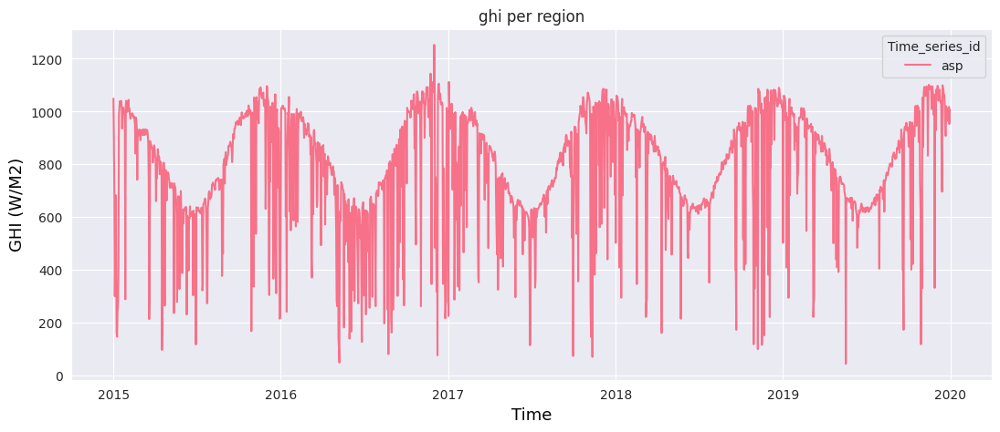

In [8]:
# add additional features

DF["hour"] = DF.Time.dt.hour
DF["day"] = DF.Time.dt.day
DF["month"] = DF.Time.dt.month

#plt.rcParams.update(plt.rcParamsDefault)
sns.set_style('darkgrid')
sns.color_palette("tab10")

fig, ax = plt.subplots(figsize=(13, 5))

sns.lineplot(data=  DF[DF['hour'] == 1],
             x='Time',
             y='ghi',
             hue='Time_series_id',
             legend='full',
             palette='husl').set_title('ghi per region')

ax.set_xlabel("Time", fontdict={"color":  "black", "size": 13} )
ax.set_ylabel("GHI (W/M2)", fontdict={"color":  "black", "size":13})
ax.tick_params(axis = 'both', which = 'major', labelsize = 10)
#ax.set_title(label = "", fontdict={"color":  "black", "size": 15})

In [9]:
def plot_history(data):
    fig=go.Figure()
    fig.add_trace(go.Scatter(x=data.index,y=data['ghi'],name='full history of GHI'))
    fig.update_layout(showlegend=True,title="history of GHI",xaxis_title="Time(1 hour)",yaxis_title="Global_Horizontal_Radiation",font=dict(family="courier New, monospace"))
    plt.savefig("ghi.png")
    fig.show()

plot_history(DF)

<Figure size 640x480 with 0 Axes>

Data Preparation

In [10]:
training_start = int(len(DF) * 0.6)
validation_start = int(len(DF) * 0.8)

train = DF.iloc[:training_start]
val = DF.iloc[training_start:validation_start]
test = DF.iloc[validation_start:]


In [11]:
max_prediction_length =12#forecast horizone
max_encoder_length =48#loookback

training = TimeSeriesDataSet(
    train,
     time_idx="time_idx",
    target="ghi",
    group_ids=['Time_series_id'],
     min_encoder_length=max_encoder_length // 2,  # keep encoder length long (as it is in the validation set)
     max_encoder_length=max_encoder_length,
     min_prediction_length=1,
     max_prediction_length=max_prediction_length,
     static_categoricals=['Time_series_id'],
    static_reals=[],
    variable_groups={},
    time_varying_known_reals=["time_idx","Clear sky GHI"],

    time_varying_unknown_reals=["ghi"],
     allow_missing_timesteps=True,
     target_normalizer=GroupNormalizer(
        groups=['Time_series_id'], transformation="softplus"),
    add_relative_time_idx=True,
    add_target_scales=True,
    add_encoder_length=True,)


# convert datasets to dataloaders for training
#Batch size should be a power of two to take full advantage of the GPU processing. Typical values are 32, 64, 128, 256 or 512. However, you should experiment with different batch sizes and evaluate the performance on the validation set to find the optimal value for your problem.
# create training testing and validation dataloaders for model

batch_size =64
validation=TimeSeriesDataSet.from_dataset(training,val,stop_randomization=True)
testing=TimeSeriesDataSet.from_dataset(training,test,stop_randomization=True)

train_dataloader = training.to_dataloader(train=True, batch_size=batch_size, num_workers=2)
val_dataloader = validation.to_dataloader(train=False, batch_size=batch_size*10, num_workers=2)
test_dataloader = testing.to_dataloader(train=False, batch_size=batch_size*10, num_workers=2)


Build TFT model

In [12]:
# define callbacks
early_stop_callback = EarlyStopping(monitor="val_loss", min_delta=1e-4, patience=10, verbose=False, mode="min")
lr_logger = LearningRateMonitor()  # log the learning rate
logger = TensorBoardLogger("lightning_logs")  # logging results to a tensorboard

# create trainer
trainer = pl.Trainer(
    max_epochs=100,
    accelerator="gpu" if torch.cuda.is_available() else "cpu",
    devices=1,
    gradient_clip_val=0.1,
    limit_train_batches=30,  # run validation every 30 batches
    # fast_dev_run=True,  # comment in to check that networkor dataset has no serious bugs
    log_every_n_steps=2,
    callbacks=[lr_logger, early_stop_callback],
    logger=logger,
)


# define network to train - the architecture is mostly inferred from the dataset, so that only a few hyperparameters have to be set by the user
tft = TemporalFusionTransformer.from_dataset(
    # dataset
    training,
    # architecture hyperparameters
    hidden_size=160,#hidden_size – hidden size of network which is its main hyperparameter and can range from 8 to 512
    attention_head_size=4,#attention_head_size – number of attention heads (4 is a good default)
    dropout=0.1,
    hidden_continuous_size=160,
    output_size=7,   # there are 7 quantiles by default: [0.02, 0.1, 0.25, 0.5, 0.75, 0.9, 0.98]
    # loss metric to optimize
    loss=QuantileLoss(),
    # logging frequency
    log_interval=10,
    # optimizer parameters
    learning_rate=0.001,
    optimizer="Adam",
    reduce_on_plateau_patience=5
)
print(f"Number of parameters in network: {tft.size()/1e3:.1f}k")

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs


Number of parameters in network: 2322.5k


/usr/local/lib/python3.10/dist-packages/lightning/pytorch/utilities/parsing.py:196: UserWarning:

Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.

/usr/local/lib/python3.10/dist-packages/lightning/pytorch/utilities/parsing.py:196: UserWarning:

Attribute 'logging_metrics' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['logging_metrics'])`.



In [13]:

# fit the model on the data - redefine the model with the correct learning rate if necessary
trainer.fit(tft, train_dataloaders=train_dataloader, val_dataloaders=val_dataloader)



INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            | Params
----------------------------------------------------------------------------------------
0  | loss                               | QuantileLoss                    | 0     
1  | logging_metrics                    | ModuleList                      | 0     
2  | input_embeddings                   | MultiEmbedding                  | 1     
3  | prescalers                         | ModuleDict                      | 2.2 K 
4  | static_variable_selection          | VariableSelectionNetwork        | 313 K 
5  | encoder_variable_selection         | VariableSelectionNetwork        | 418 K 
6  | decoder_variable_selection         | VariableSelectionNetwork        | 313 K 
7  | static_context_variable_selection  | GatedResidualNetwork            | 103 K 
8  | static_context_initia

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

In [15]:
# load the best model according to the validation loss
# (given that we use early stopping, this is not necessarily the last epoch)
best_model_path = trainer.checkpoint_callback.best_model_path
best_tft = TemporalFusionTransformer.load_from_checkpoint(best_model_path)


/usr/local/lib/python3.10/dist-packages/lightning/pytorch/utilities/parsing.py:196: UserWarning:

Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.

/usr/local/lib/python3.10/dist-packages/lightning/pytorch/utilities/parsing.py:196: UserWarning:

Attribute 'logging_metrics' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['logging_metrics'])`.



In [16]:
# Start tensorboard
%load_ext tensorboard
%tensorboard --logdir lightning_logs

<IPython.core.display.Javascript object>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
# assuming your model is stored in a variable called model
torch.save(best_tft.state_dict(), '/content/drive/MyDrive/ASP_tft_12h.pth')


Mounted at /content/drive


# Evaluate on testing data and plot results

In [17]:
y_test = torch.cat([y for x, (y, weight) in iter(test_dataloader)])
y_pred= best_tft.predict(test_dataloader)
y_pred=y_pred.cpu()
y_pred=np.nan_to_num(y_pred)
MAE = mean_absolute_error(y_test,y_pred)
print("MAE = ", MAE)
MSE = mean_squared_error(y_test,y_pred)
print("MSE = ", MSE)
from math import sqrt
RMSE=sqrt(MSE)
print("RMSE = ", RMSE)

R2_Score = r2_score(y_test,y_pred)
print("R2_Score = {}%".format(round(R2_Score*100,2)))

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


MAE =  26.13283
MSE =  5315.142
RMSE =  72.9050210194315
R2_Score = 95.84%


In [18]:
test_prediction_results = best_tft.predict(
    test_dataloader,
    mode="raw",
    return_index=True, # return the prediction index in the same order as the output
    return_x=True, # return network inputs in the same order as prediction output
    )

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Complete History Persistence Ensemble Baseline for probabilistic forecasting

In [ ]:
"""
#TAM
latitude = 22.7903
longitude = 5.5292

#BRB
latitude = -15.6010
longitude = -47.7130

#DAR
latitude = -12.4250
longitude = 130.8910

#FUA
latitude = 33.5822
longitude = 130.3764

#ASP
latitude = -23.7980
longitude = 133.8880

#REG
latitude = 50.2050
longitude = -104.7130

SXF
latitude = 50.2050
longitude = -104.7130

CAM
latitude = 50.2050
longitude = -104.7130

"""

In [19]:
#ASP
latitude = -23.7980
longitude = 133.8880

In [20]:
def forecast_CH_PeEn(GHI, percentiles, sun_up, clearsky_GHI, ts_per_hour):
    # Clear sky indices
    CSI = GHI / clearsky_GHI
    fc = np.array([[stats.mstats.mquantiles(CSI[:, int((np.ceil(t/ts_per_hour)-1)*ts_per_hour):int((np.ceil(t/ts_per_hour)-1)*ts_per_hour+ts_per_hour)][sun_up[:, int((np.ceil(t/ts_per_hour)-1)*ts_per_hour):int((np.ceil(t/ts_per_hour)-1)*ts_per_hour+ts_per_hour)]].flatten() * clearsky_GHI[day,t], prob=percentiles) if sun_up[day,t] else np.zeros(len(percentiles)) for t in range(GHI.shape[1])] for day in range(GHI.shape[0])])
    return fc

GHI=np.array(DF['ghi']).reshape(-1,24)
clearsky_GHI= np.array(DF['Clear sky GHI']).reshape(-1,24)
percentiles = np.array([0.02, 0.1, 0.25, 0.5, 0.75, 0.9, 0.98])


# convert the Time column to a pandas.DatetimeIndex
times = pd.to_datetime(DF['Time'], utc=True)

# calculate the solar zenith angle for each time step
solpos = pvlib.solarposition.get_solarposition(times, latitude, longitude)

zenith = solpos['zenith']

# calculate the number of days and time steps per day in your data
days = len(times.dt.date.unique())
time_steps_per_day = len(times) // days

# reshape the zenith array to match the shape of your data
zenith = zenith.values.reshape((days, time_steps_per_day))

# define the sun_up matrix based on the zenith angle
sun_up = zenith < 85

ts_per_hour = 1

CH_pred = forecast_CH_PeEn(GHI, percentiles, sun_up,clearsky_GHI, ts_per_hour)
# detach predictions
output_test=test_prediction_results.output.prediction.cpu().numpy()

# Compute the CRPS for the forecast and reference
crps_forecast = ps.crps_ensemble(y_test,output_test)
crps_reference = ps.crps_ensemble(GHI,CH_pred)

# Compute the CRPSS
crpss = 1 - np.mean(crps_forecast) / np.mean(crps_reference)

# crpss now contains the CRPSS
print(crpss)
print(np.mean(crps_forecast))
print(np.mean(crps_reference))

<ipython-input-20-a9d5da442902>:3: RuntimeWarning:

divide by zero encountered in true_divide

<ipython-input-20-a9d5da442902>:3: RuntimeWarning:

invalid value encountered in true_divide



0.5703427780540091
24.89041808085453
57.93087328573597


Climatological persistence Baseline for deterministic forecasting

In [19]:

"""
#TAM
latitude = 22.7903
longitude = 5.5292
start = pd.Timestamp(2018, 1, 1, tzinfo=pytz.utc)
end = pd.Timestamp(2022, 12, 31, tzinfo=pytz.utc)



#BRB
latitude = -15.6010
longitude = -47.7130
start = pd.Timestamp(2010, 1, 1, tzinfo=pytz.utc)
end = pd.Timestamp(2014, 12, 31, tzinfo=pytz.utc)


#DAR
latitude = -12.4250
longitude = 130.8910
start = pd.Timestamp(2010, 1, 1, tzinfo=pytz.utc)
end = pd.Timestamp(2014, 12, 31, tzinfo=pytz.utc)


#FUA
latitude = 33.5822
longitude = 130.3764
start = pd.Timestamp(2018, 1, 1, tzinfo=pytz.utc)
end = pd.Timestamp(2022, 12, 31, tzinfo=pytz.utc)


#ASP
latitude = -23.7980
longitude = 133.8880
start = pd.Timestamp(2015, 1, 1, tzinfo=pytz.utc)
end = pd.Timestamp(2019, 12, 31, tzinfo=pytz.utc)


#REG
latitude = 50.2050
longitude = -104.7130
start = pd.Timestamp(2008, 1, 1, tzinfo=pytz.utc)
end = pd.Timestamp(2011, 12, 31, tzinfo=pytz.utc)


#CAM
latitude = 50.2167
longitude = -5.3167
start = pd.Timestamp(2012, 1, 1, tzinfo=pytz.utc)
end = pd.Timestamp(2016, 12, 31, tzinfo=pytz.utc)

#SXF
latitude = 43.7300
longitude = -96.6200
start = pd.Timestamp(2015, 1, 1, tzinfo=pytz.utc)
end = pd.Timestamp(2019, 12, 31, tzinfo=pytz.utc)

"""


'\n#TAM\nlatitude = 22.7903\nlongitude = 5.5292\nstart = pd.Timestamp(2018, 1, 1, tzinfo=pytz.utc)\nend = pd.Timestamp(2022, 12, 31, tzinfo=pytz.utc)\n\n\n\n#BRB\nlatitude = -15.6010\nlongitude = -47.7130\nstart = pd.Timestamp(2010, 1, 1, tzinfo=pytz.utc)\nend = pd.Timestamp(2014, 12, 31, tzinfo=pytz.utc)\n\n\n#DAR\nlatitude = -12.4250\nlongitude = 130.8910\nstart = pd.Timestamp(2010, 1, 1, tzinfo=pytz.utc)\nend = pd.Timestamp(2014, 12, 31, tzinfo=pytz.utc)\n\n\n#FUA\nlatitude = 33.5822\nlongitude = 130.3764\nstart = pd.Timestamp(2018, 1, 1, tzinfo=pytz.utc)\nend = pd.Timestamp(2022, 12, 31, tzinfo=pytz.utc)\n\n\n#ASP\nlatitude = -23.7980\nlongitude = 133.8880\nstart = pd.Timestamp(2015, 1, 1, tzinfo=pytz.utc)\nend = pd.Timestamp(2019, 12, 31, tzinfo=pytz.utc)\n\n\n#REG\nlatitude = 50.2050\nlongitude = -104.7130\nstart = pd.Timestamp(2008, 1, 1, tzinfo=pytz.utc)\nend = pd.Timestamp(2011, 12, 31, tzinfo=pytz.utc)\n\n\n#CAM\nlatitude = 50.2167\nlongitude = -5.3167\nstart = pd.Timestamp(2

In [21]:
#ASP
latitude = -23.7980
longitude = 133.8880
start = pd.Timestamp(2015, 1, 1, tzinfo=pytz.utc)
end = pd.Timestamp(2019, 12, 31, tzinfo=pytz.utc)


In [22]:

# Create a date range
dates = pd.date_range(start=start, end=end, freq='H')

# Calculate the solar position for each date in the range
solpos = pvlib.solarposition.get_solarposition(dates, latitude, longitude)

# Get the zenith angle for each date in the range
zenith_angles = solpos['zenith']

# Create a DataFrame with the timestamps and zenith angles
angles_df = pd.DataFrame({'Time': dates, 'zenith_angle': zenith_angles})
# Merge the two DataFrames on the Time column
df = pd.merge(test, angles_df, on='Time')
# Create a boolean mask that is True for rows where the zenith_angle is less than 85 degrees
mask = df['zenith_angle'] < 85

# Apply the mask to the DataFrame to only keep rows where the mask is True
test = df[mask]


In [23]:


# Define the real GHI values and clear-sky GHI predictions
real_ghi_vals = test['ghi'].tolist()
clear_sky_preds = test['Clear sky GHI'].tolist()
# Define the number of forecast horizons
num_horizons = 24

# Initialize a list to store the Smart Persistence predictions for each horizon
smart_persistence_preds = [[] for _ in range(num_horizons)]

# Loop through each forecast horizon
for h in range(num_horizons):
    # Calculate the Smart Persistence predictions for the current horizon
    for i in range(len(real_ghi_vals)):
        if i <= h:
            continue
        if clear_sky_preds[i-h-1] == 0:
            smart_persistence_preds[h].append(clear_sky_preds[i])
        else:
            smart_persistence_preds[h].append((clear_sky_preds[i] * real_ghi_vals[i-h-1]) / clear_sky_preds[i-h-1])

# Display the resulting predictions for each horizon
for h in range(num_horizons):
    print(f"Horizon {h+1}: {smart_persistence_preds[h]}")


# Initialize a list to store the RMSE values for each horizon
rmse_vals = []

# Loop through each forecast horizon
for h in range(num_horizons):
    # Calculate the squared differences between the predicted and real GHI values for the current horizon
    squared_diffs = [(smart_persistence_preds[h][i] - real_ghi_vals[i+h+1])**2 for i in range(len(smart_persistence_preds[h]))]

    # Calculate the mean of the squared differences
    mean_squared_diff = np.mean(squared_diffs)

    # Calculate the square root of the mean squared difference
    rmse = np.sqrt(mean_squared_diff)

    # Store the resulting RMSE value
    rmse_vals.append(rmse)

# Display the resulting RMSE values for each horizon
for h in range(num_horizons):
    print(f"Horizon {h+1}: {rmse_vals[h]}")


Horizon 1: [454.27181653288727, 680.0455406957425, 872.7122849780834, 371.6969197407796, 541.3072895383133, 502.02604553901904, 651.0048911626546, 901.2054575107059, 718.1538084371919, 506.0670440556435, 269.31169749914613, 41.7728194166199, 64.59761199152938, 434.66489054590863, 675.9691969466583, 866.9679467240347, 1001.1887774192655, 1098.820046219655, 1121.5916137109034, 1042.0757863967253, 923.2316383069433, 746.9393062919888, 525.0500384902315, 279.9829818476229, 58.72114488006147, 211.48156544054748, 480.7483186732132, 717.837598296166, 908.4686109811599, 1060.7288557151091, 1143.8088771983378, 1153.8468022808872, 1088.8382679752285, 956.5610444109379, 764.9678828243356, 534.6210559624457, 284.63316506938236, 59.46333598833812, 234.63614966977957, 462.1560180841652, 699.8878389744733, 904.0784458445502, 1053.0416339572255, 1135.7774466309543, 1148.072507937745, 1084.9011302362603, 953.9915986182586, 764.6468821674524, 535.3431801550458, 283.407134677139, 58.61786244723192, 198.8

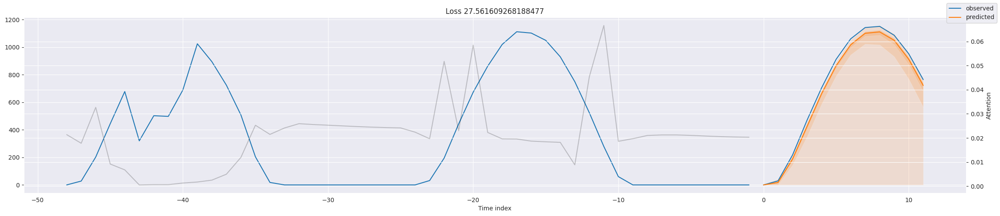

In [24]:
# Plot predictions and attention
# for idx in range(test_predictions.prediction.shape[0]):
from pytorch_forecasting.metrics import SMAPE, PoissonLoss, QuantileLoss
for idx in range(1):
    fig, ax = plt.subplots(figsize=(23,5))
    best_tft.plot_prediction(
        test_prediction_results.x,
        test_prediction_results.output,
        idx=idx,
        show_future_observed=True,
        add_loss_to_title=QuantileLoss(quantiles=best_tft.loss.quantiles),

        ax=ax,
        )

Extreme Event Detection

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.10/dist-packages/pytorch_forecasting/models/base_model.py:1888: RuntimeWarning:

Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.

/usr/local/lib/python3.10/dist-packages/pytorch_forecasting/models/base_model.py:1888: RuntimeWarning:

Preci

{'encoder_length': <Figure size 1000x500 with 2 Axes>,
 'ghi_center': <Figure size 1000x500 with 2 Axes>,
 'ghi_scale': <Figure size 1000x500 with 2 Axes>,
 'time_idx': <Figure size 1000x500 with 2 Axes>,
 'Clear sky GHI': <Figure size 1000x500 with 2 Axes>,
 'relative_time_idx': <Figure size 1000x500 with 2 Axes>,
 'ghi': <Figure size 1000x500 with 2 Axes>,
 'Time_series_id': <Figure size 640x480 with 2 Axes>}

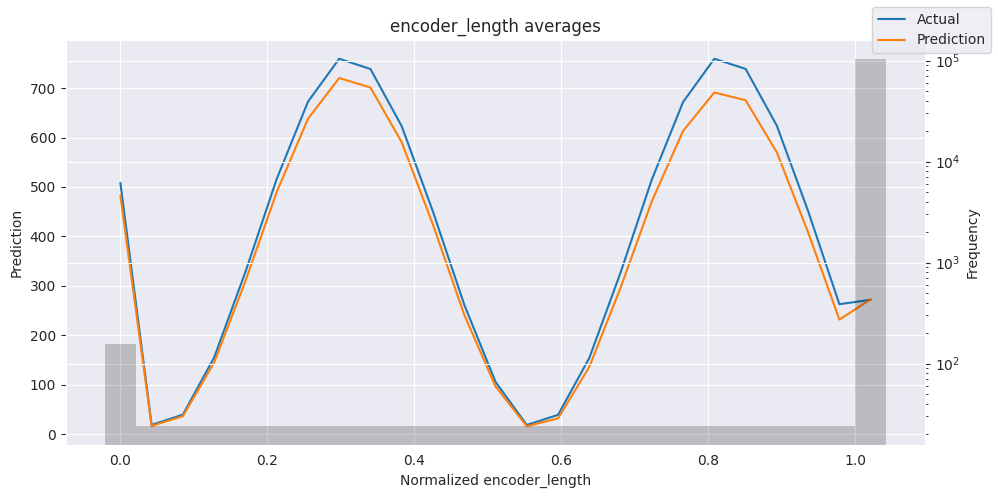

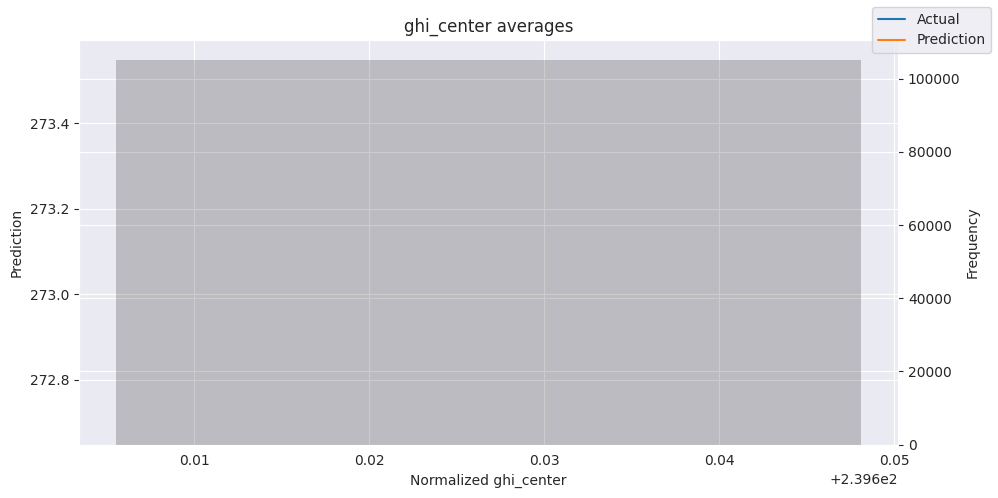

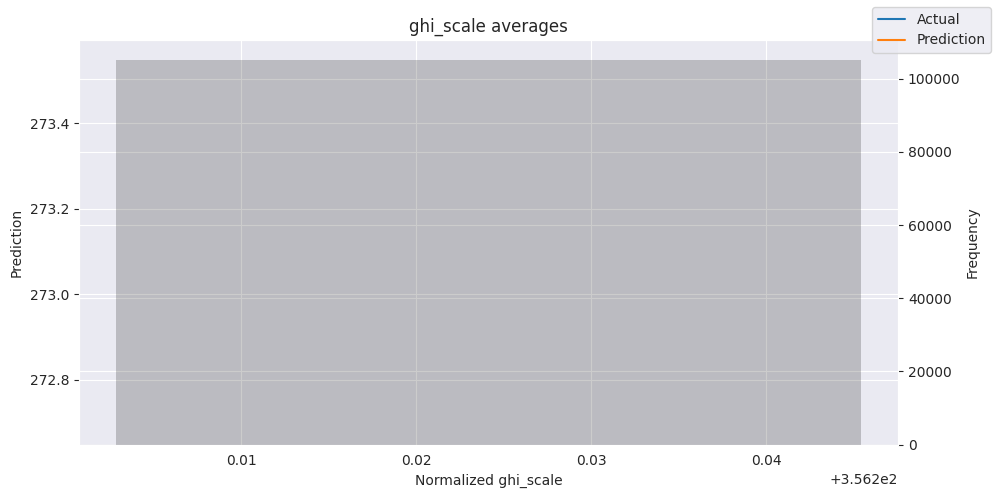

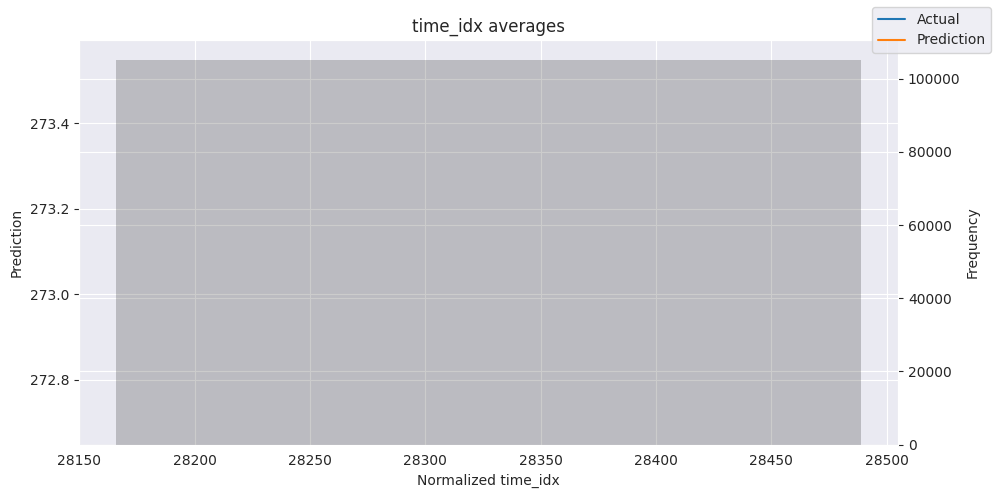

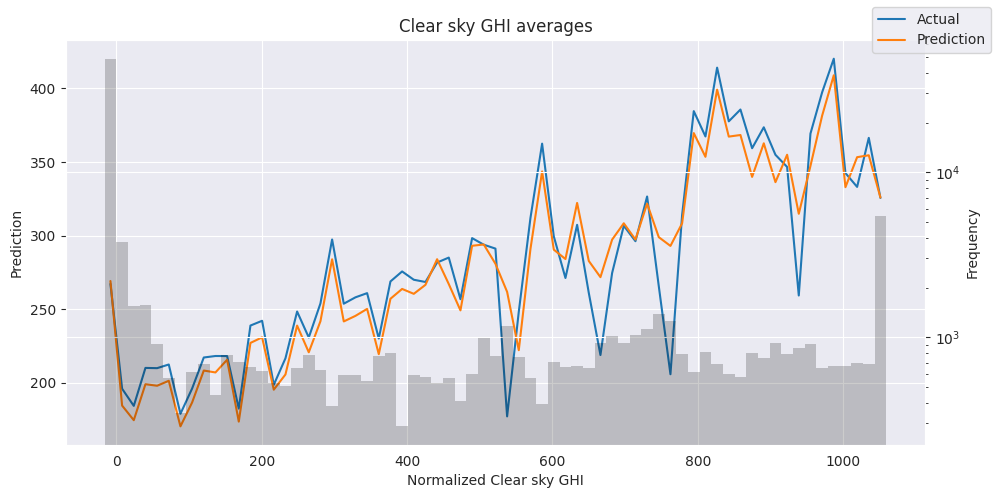

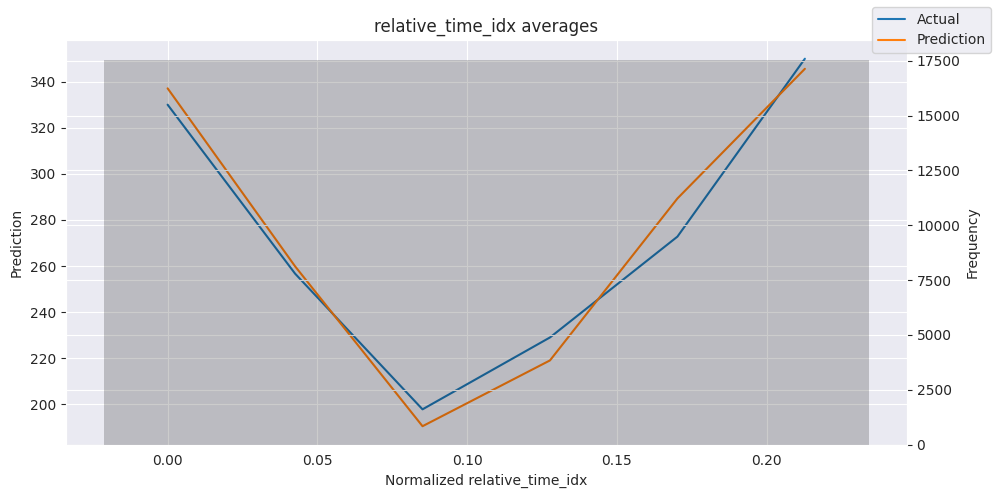

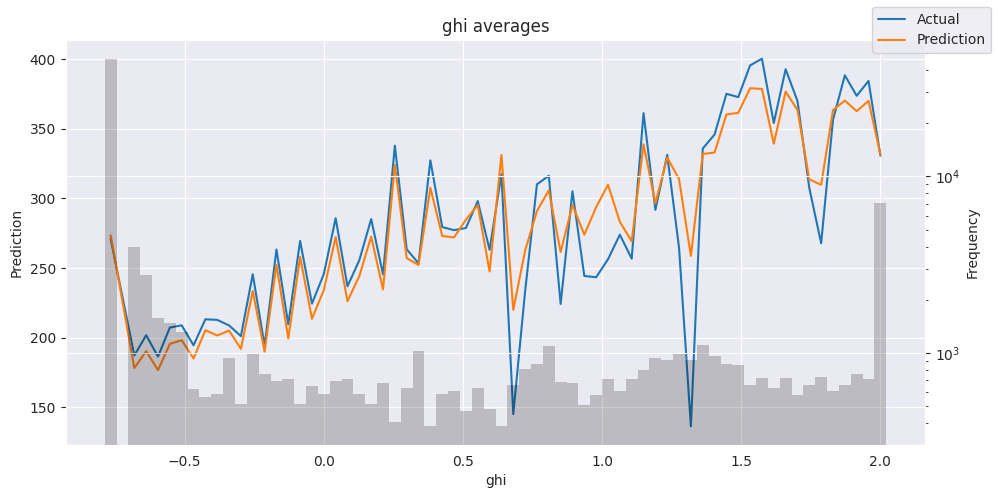

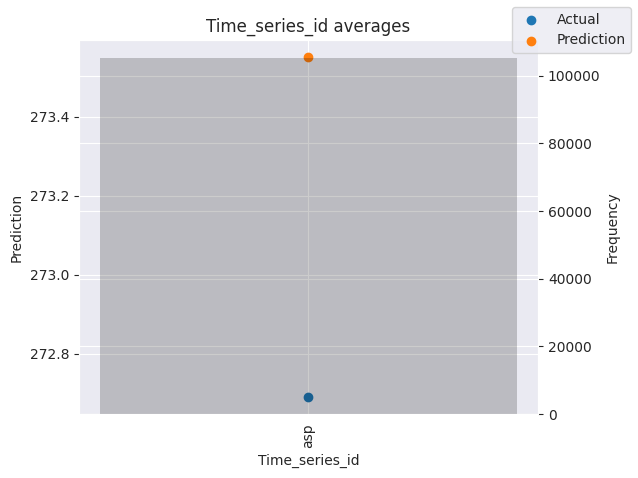

In [25]:
predictions = best_tft.predict(test_dataloader, return_x=True)
predictions_vs_actuals = best_tft.calculate_prediction_actual_by_variable(predictions.x, predictions.output)
best_tft.plot_prediction_actual_by_variable(predictions_vs_actuals)


In [26]:
# detach predictions
test_prediction_results.output.prediction.cpu().numpy().shape

(8776, 12, 7)

# Feature Importances¶

{'attention': <Figure size 640x480 with 1 Axes>,
 'static_variables': <Figure size 700x300 with 1 Axes>,
 'encoder_variables': <Figure size 700x300 with 1 Axes>,
 'decoder_variables': <Figure size 700x275 with 1 Axes>}

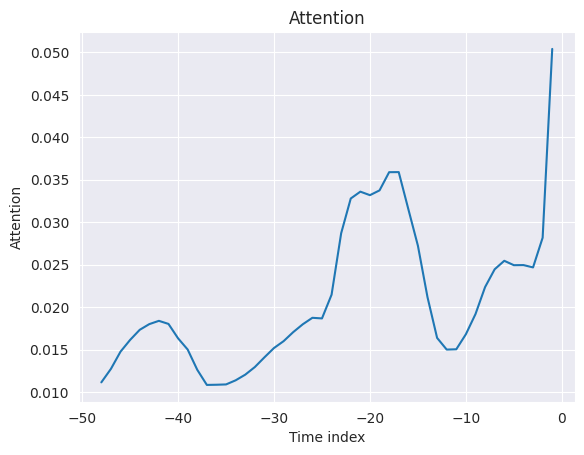

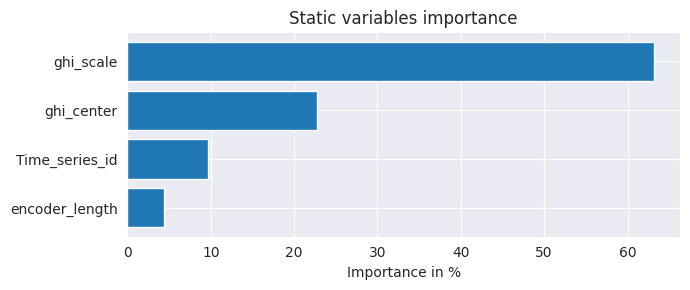

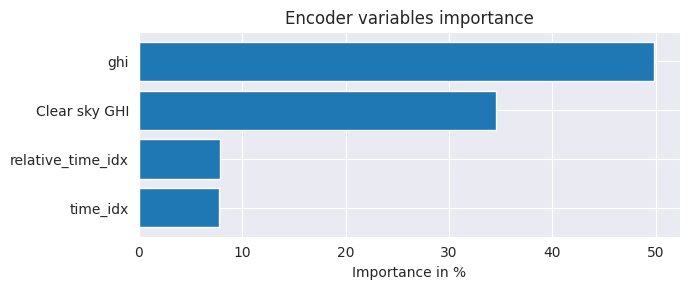

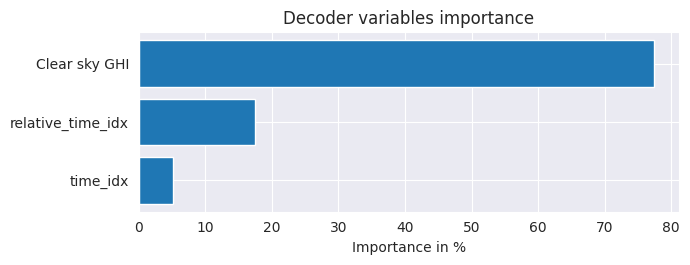

In [27]:
# plot variable importance
# plot variable importance
interpretation = best_tft.interpret_output(test_prediction_results.output, reduction="sum")
best_tft.plot_interpretation(interpretation)

GET PREDICTIONS FOR EACH QUANTILE (I GOT 7 QUANTILES)

In [28]:
# get 0.5 quantile (median) predictions
median_predictions = test_prediction_results.output.prediction.cpu().numpy()[:,:,4]


Partial dependency

In [29]:
dependency = best_tft.predict_dependency(
    val_dataloader.dataset, "Clear sky GHI", np.linspace(0, 30, 30), show_progress_bar=True, mode="dataframe"
)

Predict:   0%|          | 0/30 [00:00<?, ? batches/s]

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

INFO: GPU available: True (cuda), used: True


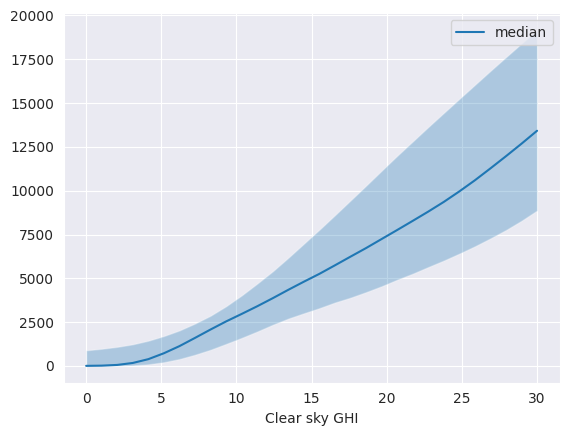

In [30]:
# plotting median and 25% and 75% percentile
agg_dependency = dependency.groupby("Clear sky GHI").normalized_prediction.agg(
    median="median", q25=lambda x: x.quantile(0.25), q75=lambda x: x.quantile(0.75)
)
ax = agg_dependency.plot(y="median")
ax.fill_between(agg_dependency.index, agg_dependency.q25, agg_dependency.q75, alpha=0.3)
